# Lab07 - Image Processing and Analysis
 
> Họ và tên: Vũ Minh Như -  MSSV: 21110360

# 📝 Đề bài

> 1. Với mỗi các phương pháp Morphology sau kiếm 1 ảnh từ internet làm ví dụ thể hiện rõ kết quả nhất :
    > - Dilation 
    > - Erosion
    > - Closing
    > - Opening
    > - Gradient 
> 2. Kiếm một ảnh biển số xe và thực hiện kết hợp các phương pháp Morphology để trích các con số trên biển số xe 
> 3. Kiếm một ảnh chụp biển hiệu shop bán hàng kết hợp các phương pháp Morphology để trích các thông tin cửa hiệu 
> 4. Chụp 1 dòng chat của bạn và sau đó dùng Morphology để trích các dòng chat đó ra 



In [2]:
#Import thư viện cần thiết
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from pylab import imread
from skimage.color import rgb2gray

In [3]:
#Viết hàm show ảnh:
def ShowImage(ImageList, nRows = 1, nCols = 2, WidthSpace = 0.00, HeightSpace = 0.00):
    from matplotlib import pyplot as plt 
    import matplotlib.gridspec as gridspec
    
    gs = gridspec.GridSpec(nRows, nCols)     
    gs.update(wspace=WidthSpace, hspace=HeightSpace) # set the spacing between axes.
    plt.figure(figsize=(20,10))
    for i in range(len(ImageList)):
        ax1 = plt.subplot(gs[i])
        ax1.set_xticklabels([])
        ax1.set_yticklabels([])
        ax1.set_aspect('equal')

        plt.subplot(nRows, nCols,i+1)

        image = ImageList[i].copy()
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
        else:
            plt.imshow(image)
        plt.title("Image " + str(i))
        plt.axis('off')

    plt.show()

In [4]:
#Hàm thông tin ảnh
def InfoImage(IM):
    Image = IM
    Width = Image.shape[1]
    Height = Image.shape[0]
    Channel = len(Image.shape)
    print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)
    
    if(Channel == 2):
        print("Min Intensity: ", IM.min(), " Max Intensity: ", IM.max())
    else:
        print("Red - Min Intensity: ", IM[:,:,0].min(), " Max Intensity: ", IM[:,:,0].max())
        print("Green - Min Intensity: ", IM[:,:,1].min(), " Max Intensity: ", IM[:,:,1].max())
        print("Blue - Min Intensity: ", IM[:,:,2].min(), " Max Intensity: ", IM[:,:,2].max())        

In [5]:
#Hàm thay đổi kích thước ảnh
def ResizeImage(IM, DesiredWidth, DesiredHeight):
    from skimage.transform import rescale, resize
    
    OrigWidth = float(IM.shape[1])
    OrigHeight = float(IM.shape[0])
    Width = DesiredWidth 
    Height = DesiredHeight

    if((Width == 0) & (Height == 0)):
        return IM
    
    if(Width == 0):
        Width = int((OrigWidth * Height)/OrigHeight)

    if(Height == 0):
        Height = int((OrigHeight * Width)/OrigWidth)

    dim = (Width, Height)
    resizedIM = cv2.resize(IM, dim, interpolation = cv2.INTER_NEAREST) 
    return resizedIM

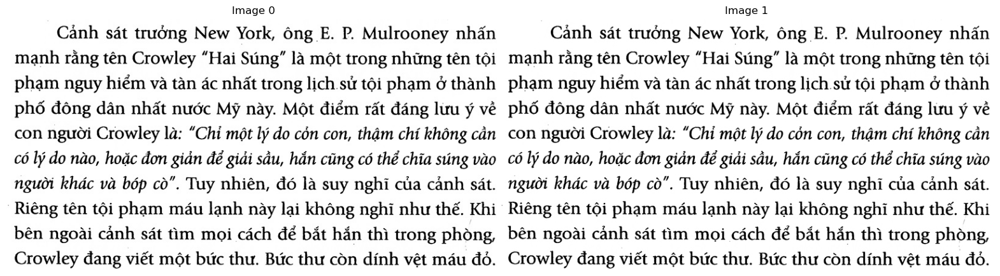

In [6]:
# Read Image 
image_color = imread("Newspaper.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

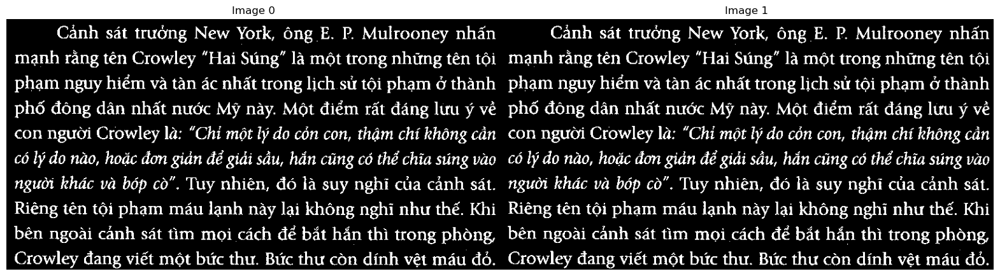

150.0


In [7]:
image_mask01 = (image_gray < 150).astype(np.uint8) * 255  # Change 0-1 to range 0-255
thresh, image_mask02 = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_mask01, image_mask02], 1, 2)
print(thresh)

In [8]:
print(image_mask01.min(), image_mask01.max())
print(image_mask02.min(), image_mask02.max())

0 255
0 255


> <b> 1.a) DILATION </b> </br>
> * <u> Dilation:</u> Giá trị của pixel đầu ra là giá trị lớn nhất của các pixels lân cận. Trong ảnh nhị phân, một pixel có giá trị 1 nếu tất cả các giá trị pixel lân cận đều là 1. Dilation giúp cho đối tượng rõ hơn và lấp đầy các lỗ trống của đối tượng.
> * Cách thức hoạt động của dilation là duyệt qua từng pixel trong hình ảnh và thay đổi giá trị của pixel đó dựa trên các pixel láng giềng xung quanh theo một quy tắc nhất định. Mục tiêu là tăng giá trị của pixel cụ thể lên giá trị tối đa trong vùng lân cận, thường sử dụng các ma trận cơ sở (kernel) để xác định vùng lân cận và quy tắc thay đổi giá trị.

[[1 1 1]
 [1 1 1]
 [1 1 1]]


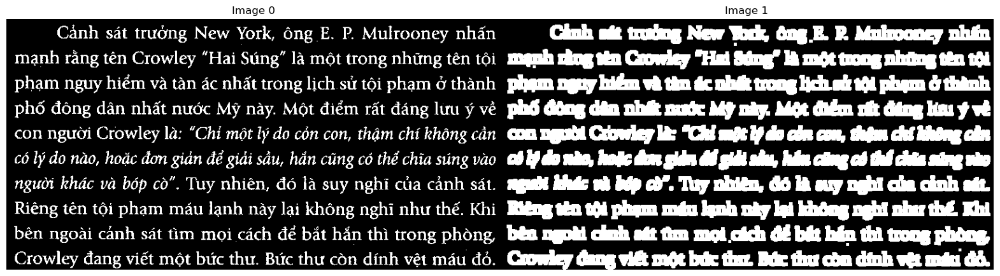

In [9]:
kernel = np.ones((3,3),np.uint8)
print(kernel)
image_dilated = cv2.dilate(image_mask01, kernel, iterations = 2)
ShowImage([image_mask01, image_dilated], 1, 2)

In [10]:
result = image_color.copy()

contours, hierarchy = cv2.findContours(image_dilated,cv2.RETR_TREE,cv2.CHAIN_APPROX_SIMPLE)
count = 0
DataDF = pd.DataFrame(columns = ["x", "y", "w", "h"])
for cnt in contours:
    x,y,w,h = cv2.boundingRect(cnt)
    if(w * h > 300):
        cv2.rectangle(result,(x,y),(x+w,y+h),(0,255,0),2) 
        DataDF.loc[count,:] = (x,y,w,h)
        count = count + 1
DataDF = DataDF.astype(int)

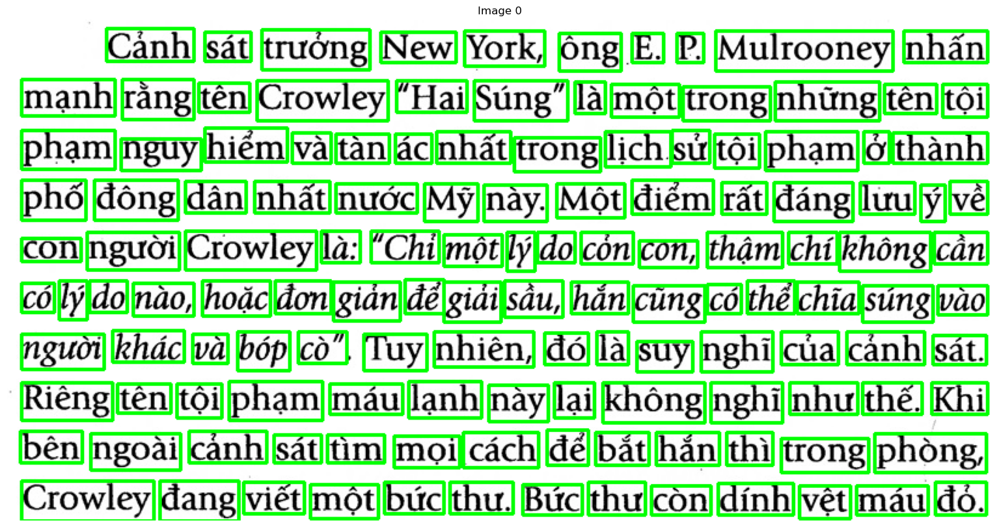

,x,y,w,h
0,700,384,59,24
1,653,384,42,27
2,531,384,49,24
3,425,383,49,25
4,250,383,56,28


In [11]:
ShowImage([result], 1, 1)
display(DataDF.head())

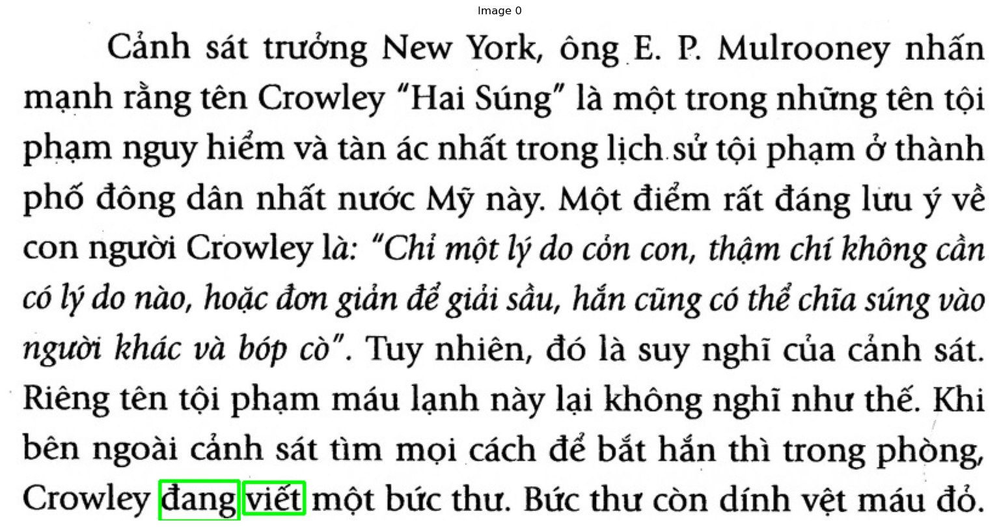

In [12]:
result01 = image_color.copy()
idx = 10
x,y,w,h = DataDF.loc[idx, ["x", "y", "w", "h"]]
cv2.rectangle(result01,(x,y),(x+w,y+h),(0,255,0),2) 

idx = 11
x,y,w,h = DataDF.loc[idx, ["x", "y", "w", "h"]]
cv2.rectangle(result01,(x,y),(x+w,y+h),(0,255,0),2) 

ShowImage([result01], 1, 1)

> <b> 1.b) EROSION </b> </br>
> * Ý tưởng cơ bản về xói mòn (erosion) cũng giống như xói mòn đất thôi, nó làm xói mòn ranh giới của vật thể ở tiền cảnh (Luôn cố gắng giữ tiền cảnh có màu trắng). Vậy nó làm gì? Hạt nhân (kernel) trượt qua hình ảnh (như trong tích chập 2D). Một pixel trong ảnh gốc (1 hoặc 0) sẽ chỉ được coi là 1 nếu tất cả các pixel bên dưới kernel là 1, nếu không nó sẽ bị xói mòn (được chuyển về 0).
> * Điều đáng tiếc là tất cả các pixel gần ranh giới sẽ bị loại bỏ tùy thuộc vào kích thước của kernel. Vì vậy, độ dày hoặc kích thước của vật thể ở tiền cảnh giảm hoặc đơn giản là vùng trắng giảm trong ảnh. Nó rất hữu ích để loại bỏ các nhiễu nhỏ màu trắng (như chúng ta đã thấy trong chương về không gian màu), tách hai đối tượng được kết nối, v.v.

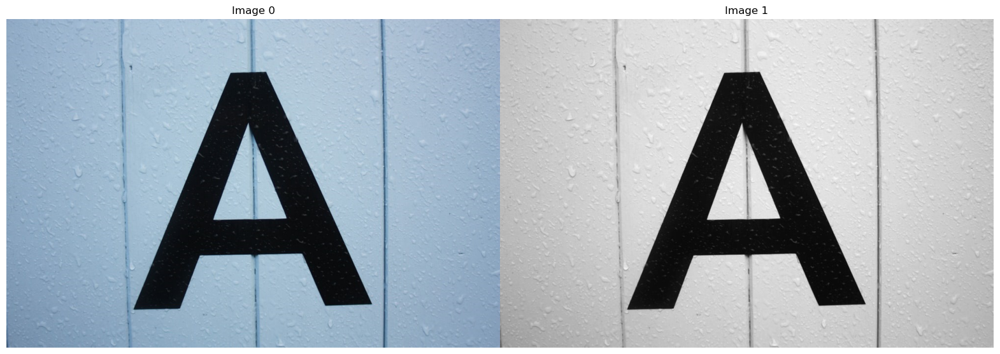

In [13]:
# Read Image 
image_color = imread("Alphabet.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

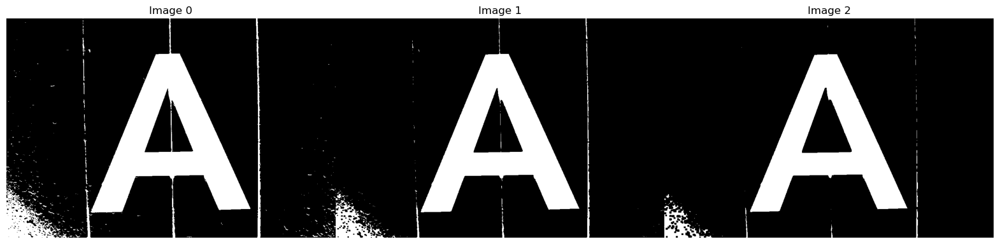

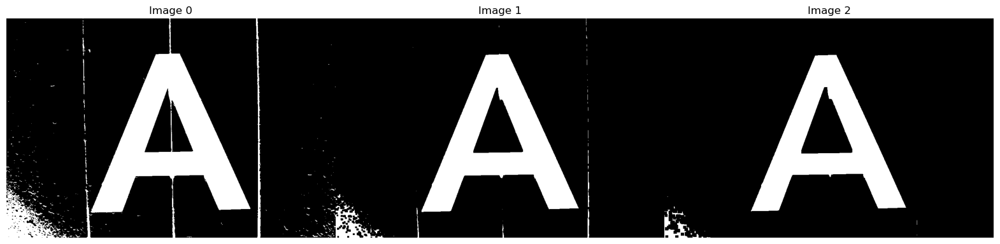

In [14]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((3,3),np.uint8)
image_erosion01 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion02 = cv2.erode(image_mask,kernel,iterations = 2)

kernel = np.ones((5,5),np.uint8)
image_erosion03 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion04 = cv2.erode(image_mask,kernel,iterations = 2)

ShowImage([image_mask, image_erosion01, image_erosion02], 1, 3)
ShowImage([image_mask, image_erosion03, image_erosion04], 1, 3)

> <b> 1.c) CLOSING </b> </br>
> Thao tác đóng (closing) làm giãn hình ảnh và sau đó làm mờ hình ảnh đã giãn ra, sử dụng cùng một phần tử cấu trúc cho cả hai thao tác. Hình thái closing rất hữu ích để lấp đầy các lỗ nhỏ trên hình ảnh trong khi vẫn giữ được hình dạng và kích thước của các đối tượng trong hình ảnh.

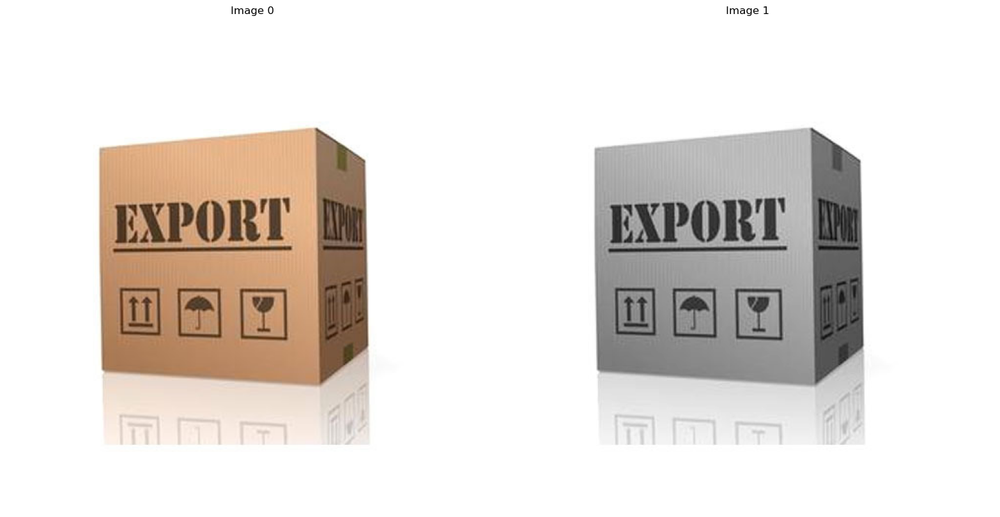

In [18]:
# Read Image 
image_color = imread("Carton Box.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

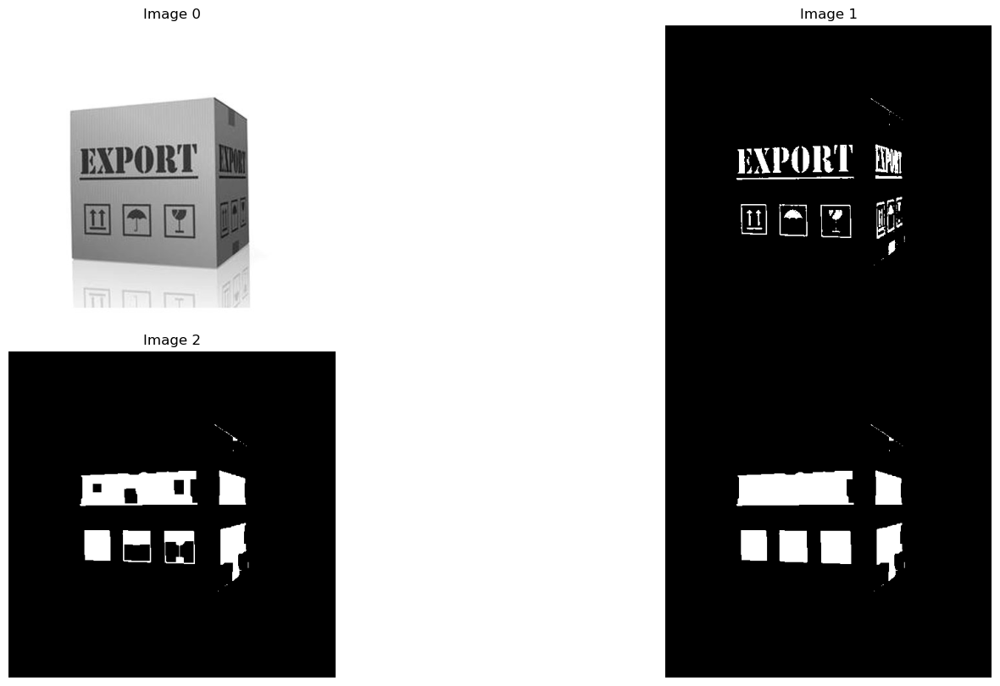

In [19]:
thresh, image_mask = cv2.threshold(image_gray,80,255,cv2.THRESH_BINARY_INV)
image_closing = cv2.morphologyEx(image_mask, cv2.MORPH_CLOSE, kernel,iterations = 3)

from scipy import ndimage as ndi
image_fill = ndi.binary_fill_holes(image_closing)

ShowImage([image_gray, image_mask, image_closing, image_fill], 2, 2)

> <b> 1.d) OPENING </b> </br>
> Thao tác mở làm xói mòn một hình ảnh và sau đó làm giãn hình ảnh bị xói mòn, sử dụng cùng một phần tử cấu trúc cho cả hai thao tác. Hình thái opening rất hữu ích để loại bỏ các đối tượng nhỏ khỏi hình ảnh trong khi vẫn giữ được hình dạng và kích thước của các đối tượng lớn hơn trong hình ảnh.

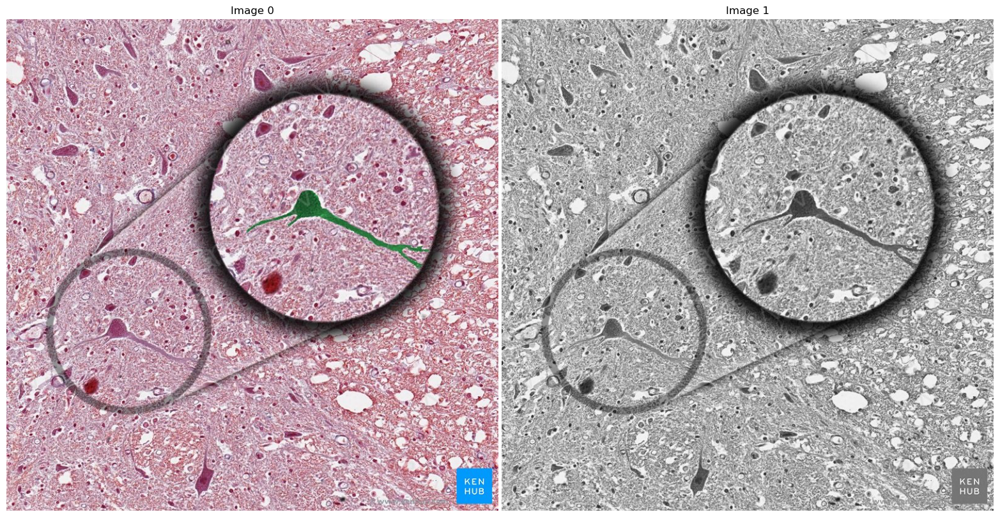

In [20]:
# Read Image 
image_color = imread("cell.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

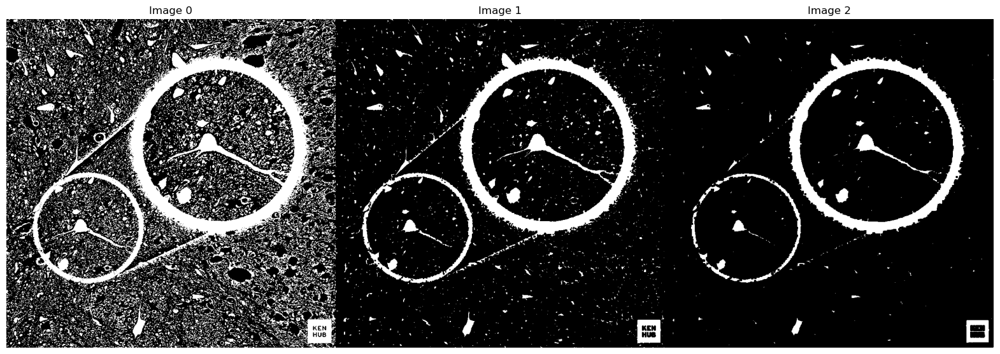

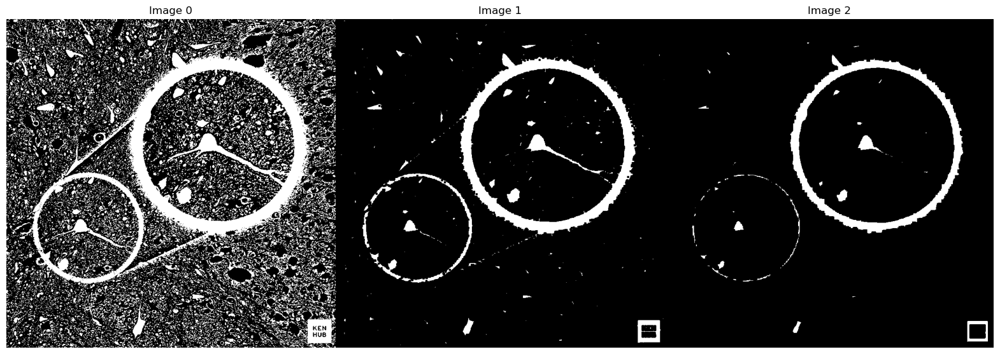

In [21]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((3,3),np.uint8)
image_erosion01 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion02 = cv2.erode(image_mask,kernel,iterations = 2)

kernel = np.ones((5,5),np.uint8)
image_erosion03 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion04 = cv2.erode(image_mask,kernel,iterations = 2)

ShowImage([image_mask, image_erosion01, image_erosion02], 1, 3)
ShowImage([image_mask, image_erosion03, image_erosion04], 1, 3)

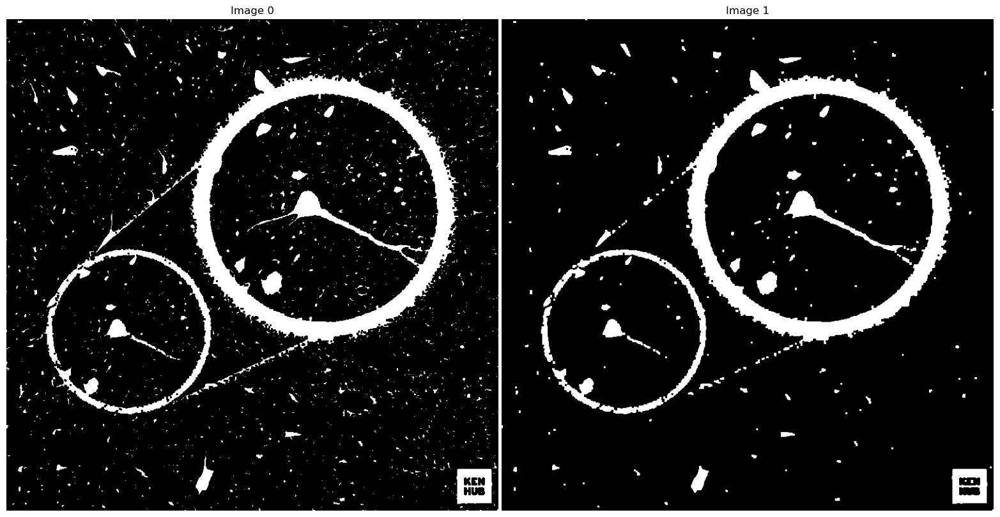

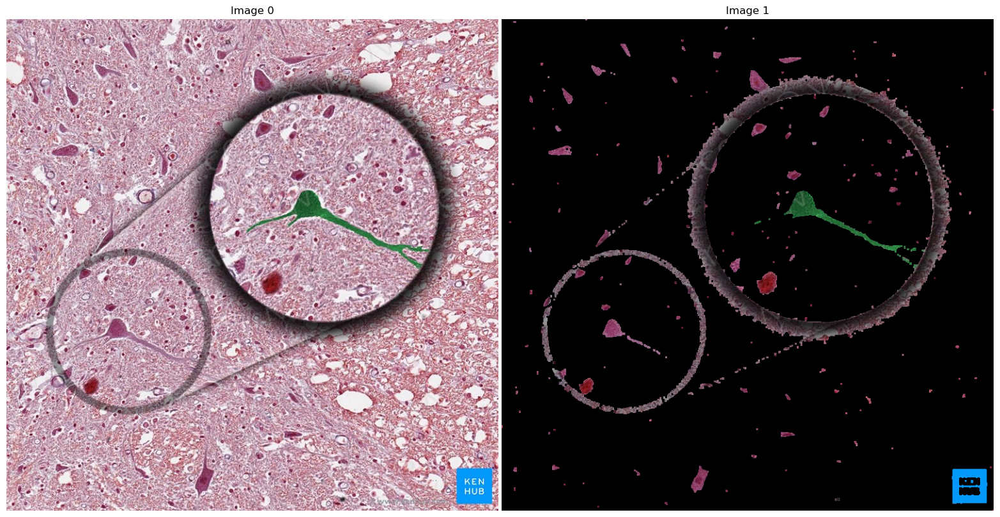

In [22]:
image_mask = image_erosion01.copy()

kernel = np.ones((3,3),np.uint8)
image_opening = cv2.morphologyEx(image_mask, cv2.MORPH_OPEN, kernel)
image_opening_color = cv2.bitwise_and(image_color, image_color, mask = image_opening)

ShowImage([image_mask, image_opening], 1, 2)
ShowImage([image_color, image_opening_color], 1, 2)

> <b> 1.e) GRADIENT </b> </br>
> Gradient là sự sai khác giữa dilation và erosion của hình ảnh. Kết quả cho thấy là những viền (outline) của đối tượng.

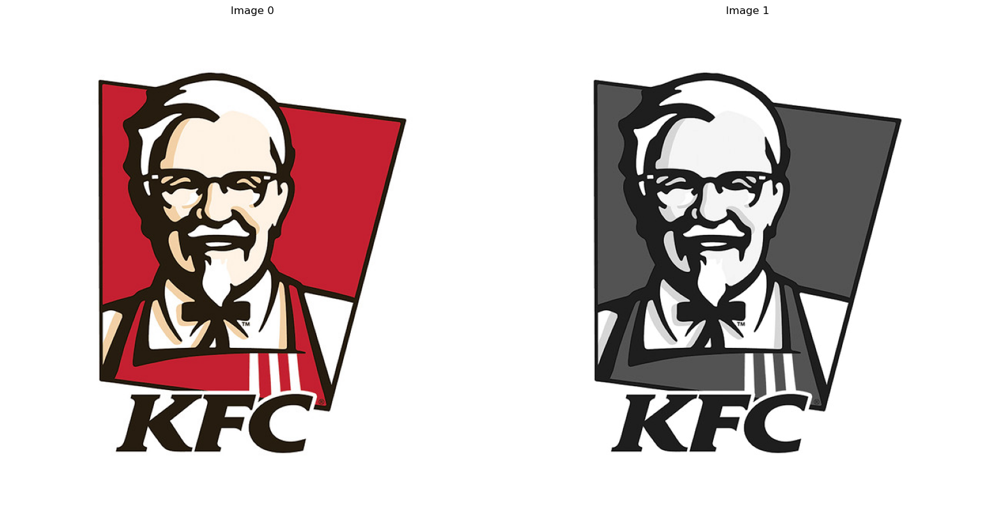

In [24]:
# Read Image 
image_color = imread("KFC.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

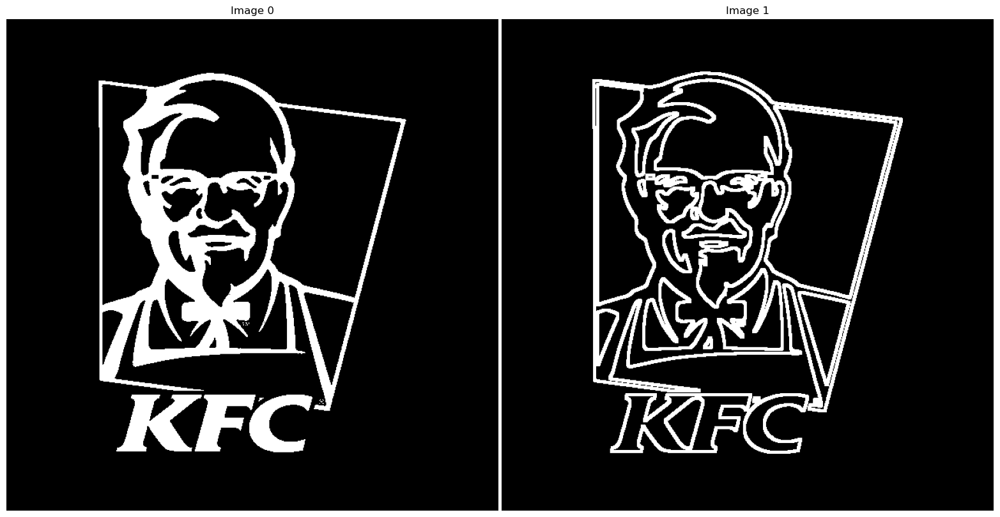

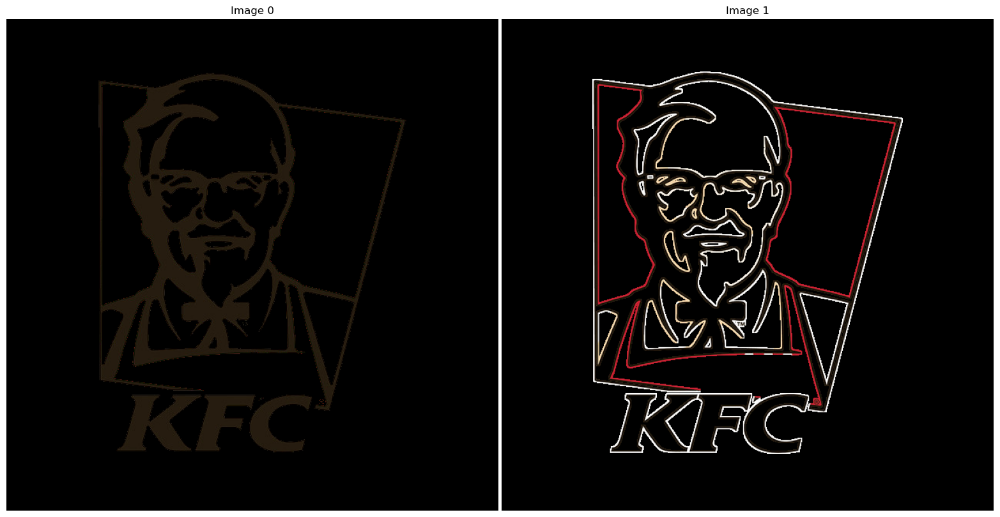

In [25]:
thresh, image_mask = cv2.threshold(image_gray,50,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((5,5),np.uint8)
image_gradient = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)

image_mask_color = cv2.bitwise_and(image_color, image_color, mask = image_mask)
image_gradient_color = cv2.bitwise_and(image_color, image_color, mask = image_gradient)

ShowImage([image_mask, image_gradient], 1, 2)
ShowImage([image_mask_color, image_gradient_color], 1, 2)


<b> Câu 2. </b> </br> Kiếm một ảnh biển số xe và thực hiện kết hợp các phương pháp Morphology để trích các con số trên biển số xe

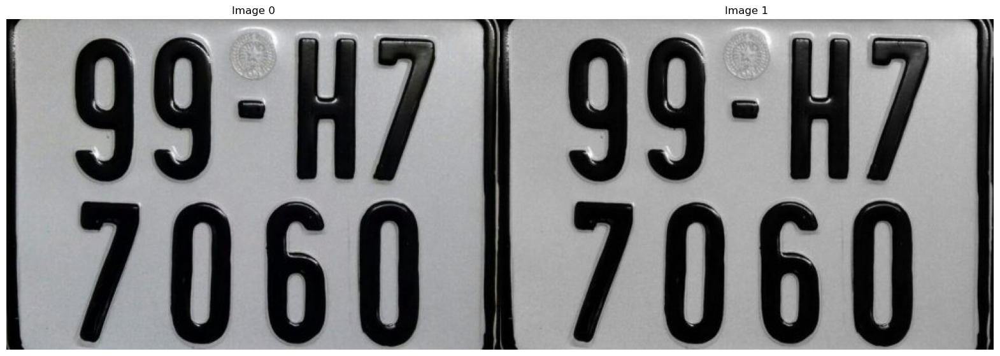

In [26]:
# Read Image 
image_color = imread("biensoxe.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

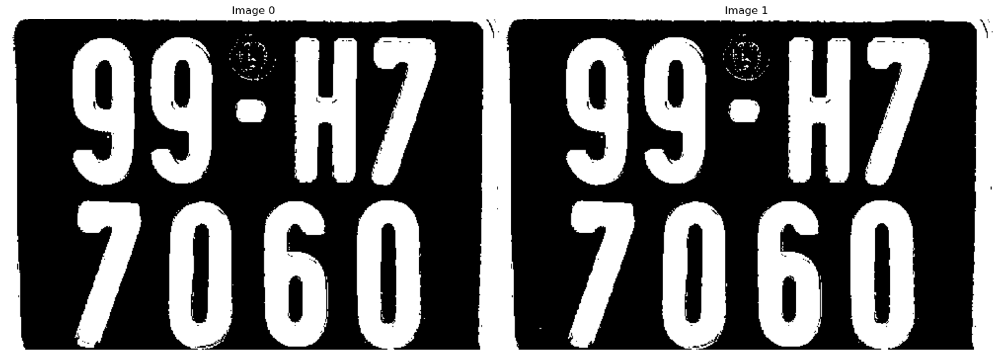

150.0


In [28]:
image_mask01 = (image_gray < 150).astype(np.uint8) * 255  # Change 0-1 to range 0-255
thresh, image_mask02 = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_mask01, image_mask02], 1, 2)
print(thresh)

In [29]:
print(image_mask01.min(), image_mask01.max())
print(image_mask02.min(), image_mask02.max())

0 255
0 255


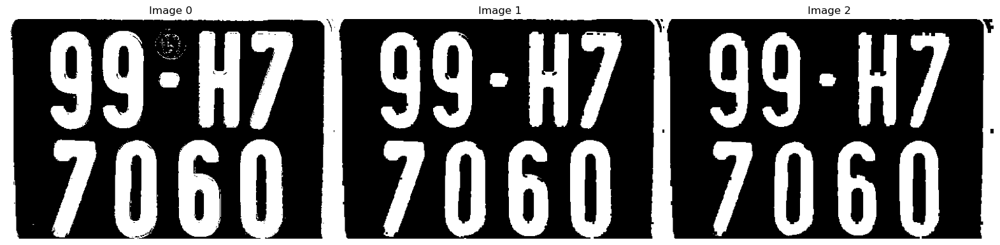

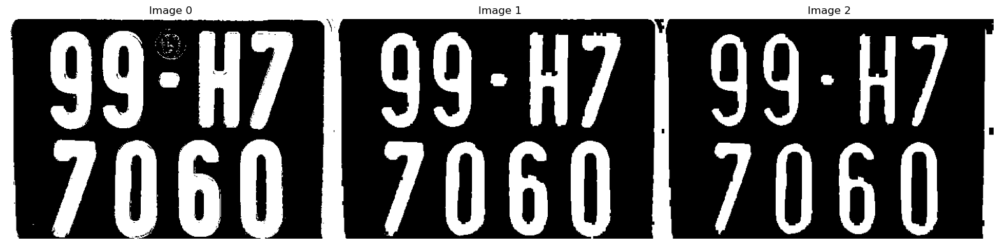

In [30]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((3,3),np.uint8)
image_erosion01 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion02 = cv2.erode(image_mask,kernel,iterations = 2)

kernel = np.ones((5,5),np.uint8)
image_erosion03 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion04 = cv2.erode(image_mask,kernel,iterations = 2)

ShowImage([image_mask, image_erosion01, image_erosion02], 1, 3)
ShowImage([image_mask, image_erosion03, image_erosion04], 1, 3)

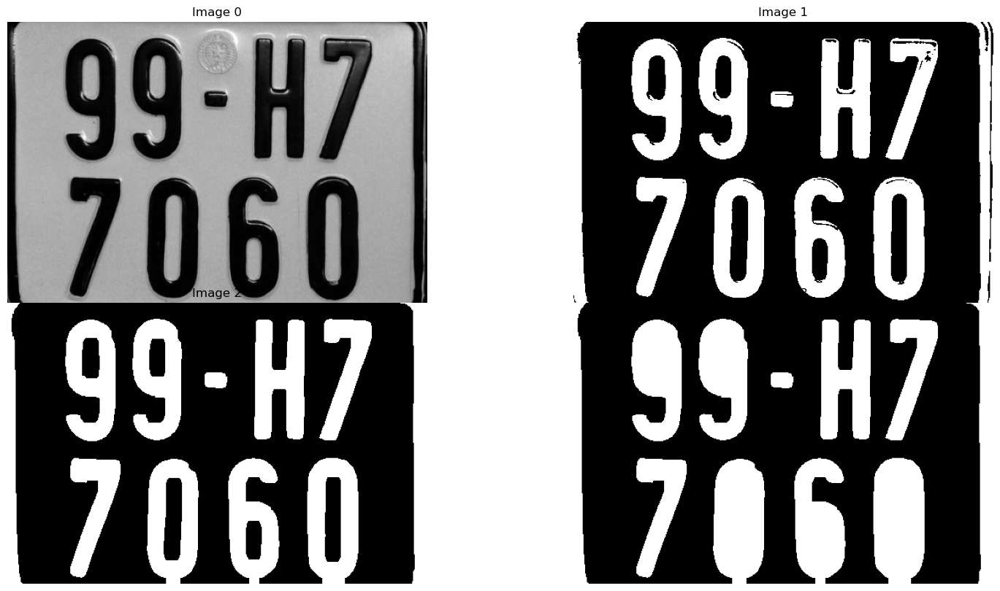

In [31]:
thresh, image_mask = cv2.threshold(image_gray,80,255,cv2.THRESH_BINARY_INV)
image_closing = cv2.morphologyEx(image_mask, cv2.MORPH_CLOSE, kernel,iterations = 3)

from scipy import ndimage as ndi
image_fill = ndi.binary_fill_holes(image_closing)

ShowImage([image_gray, image_mask, image_closing, image_fill], 2, 2)

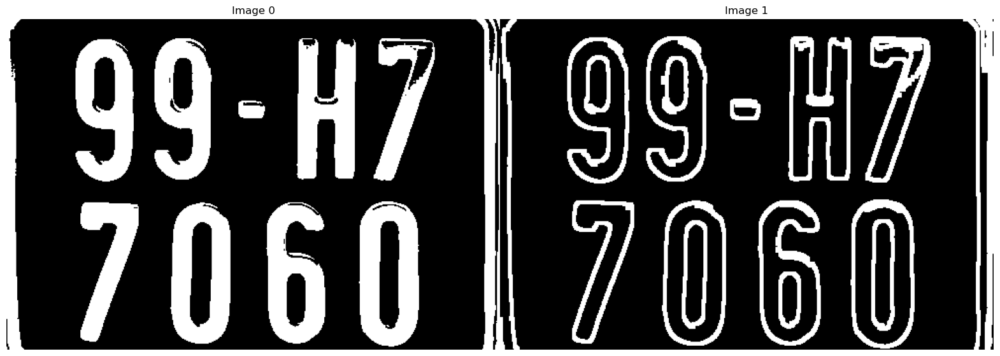

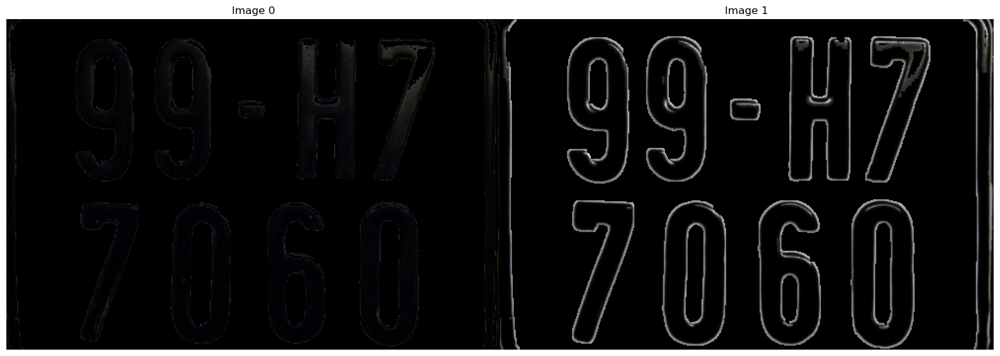

In [32]:
thresh, image_mask = cv2.threshold(image_gray,50,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((5,5),np.uint8)
image_gradient = cv2.morphologyEx(image_mask, cv2.MORPH_GRADIENT, kernel)

image_mask_color = cv2.bitwise_and(image_color, image_color, mask = image_mask)
image_gradient_color = cv2.bitwise_and(image_color, image_color, mask = image_gradient)

ShowImage([image_mask, image_gradient], 1, 2)
ShowImage([image_mask_color, image_gradient_color], 1, 2)

<b> Câu 3 </b> </br> Kiếm một ảnh chụp biển hiệu shop bán hàng kết hợp các phương pháp Morphology để trích các thông tin cửa hiệu

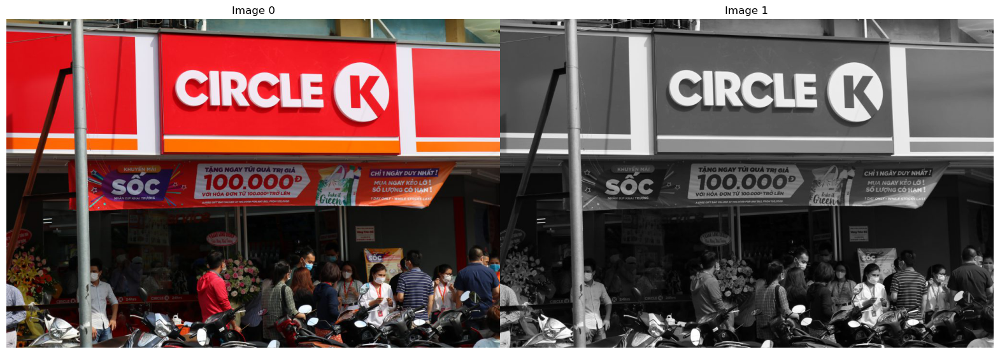

In [37]:
# Read Image 
image_color = imread("cuahieu.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

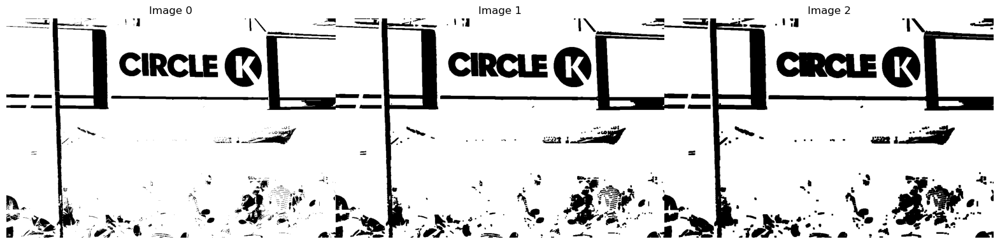

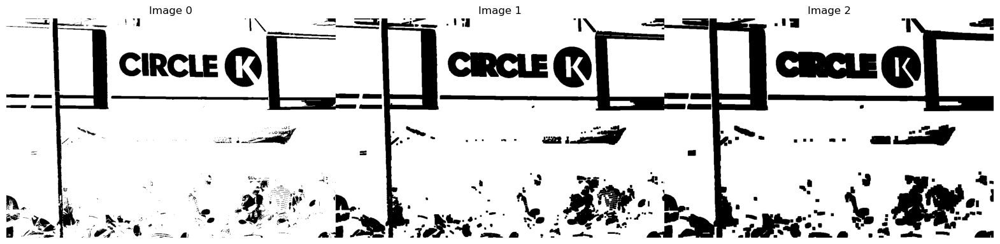

In [39]:
thresh, image_mask = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)

kernel = np.ones((3,3),np.uint8)
image_erosion01 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion02 = cv2.erode(image_mask,kernel,iterations = 2)

kernel = np.ones((5,5),np.uint8)
image_erosion03 = cv2.erode(image_mask,kernel,iterations = 1)
image_erosion04 = cv2.erode(image_mask,kernel,iterations = 2)

ShowImage([image_mask, image_erosion01, image_erosion02], 1, 3)
ShowImage([image_mask, image_erosion03, image_erosion04], 1, 3)

<b> Câu 4 </b> </br> Chụp 1 dòng chat của bạn và sau đó dùng Morphology để trích các dòng chat đó ra

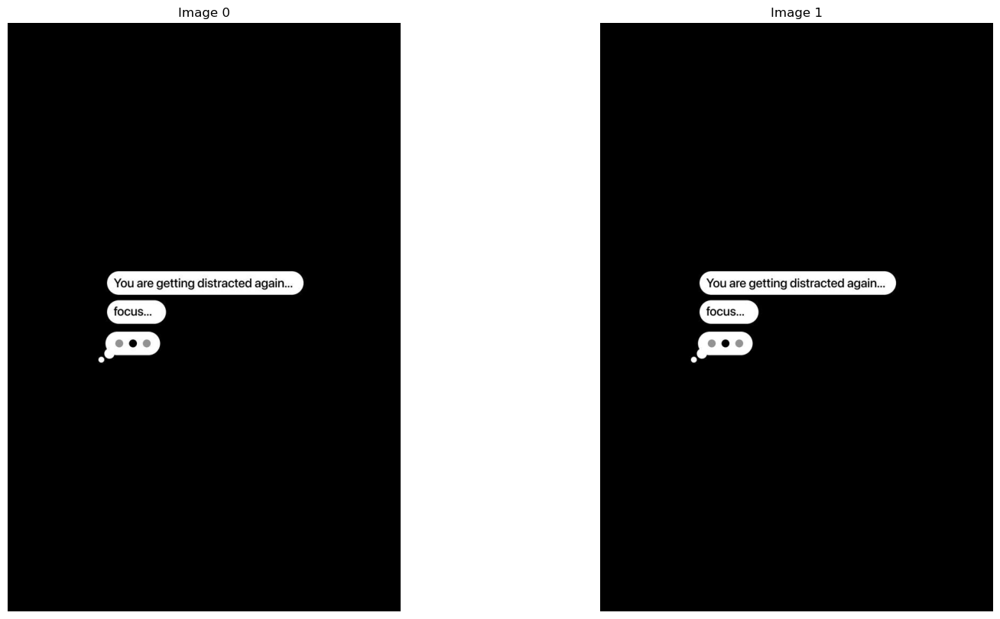

In [58]:
# Read Image 
image_color = imread("mess.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)
# Display Image
ShowImage([image_color, image_gray], 1, 2)

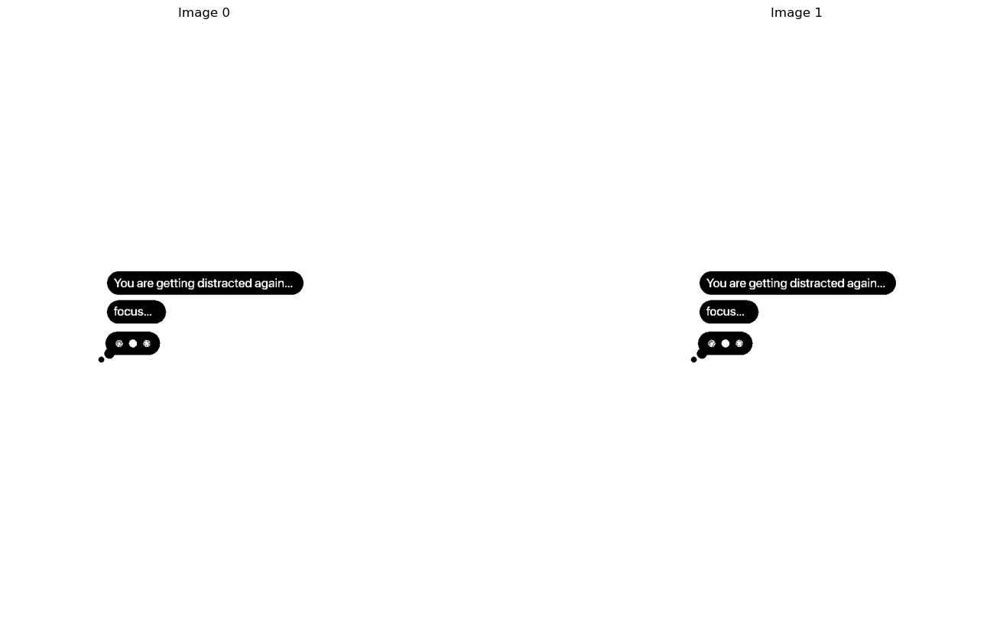

150.0


In [60]:
image_mask01 = (image_gray < 150).astype(np.uint8) * 255  # Change 0-1 to range 0-255
thresh, image_mask02 = cv2.threshold(image_gray,150,255,cv2.THRESH_BINARY_INV)
ShowImage([image_mask01, image_mask02], 1, 2)
print(thresh)

[[1 1 1]
 [1 1 1]
 [1 1 1]]


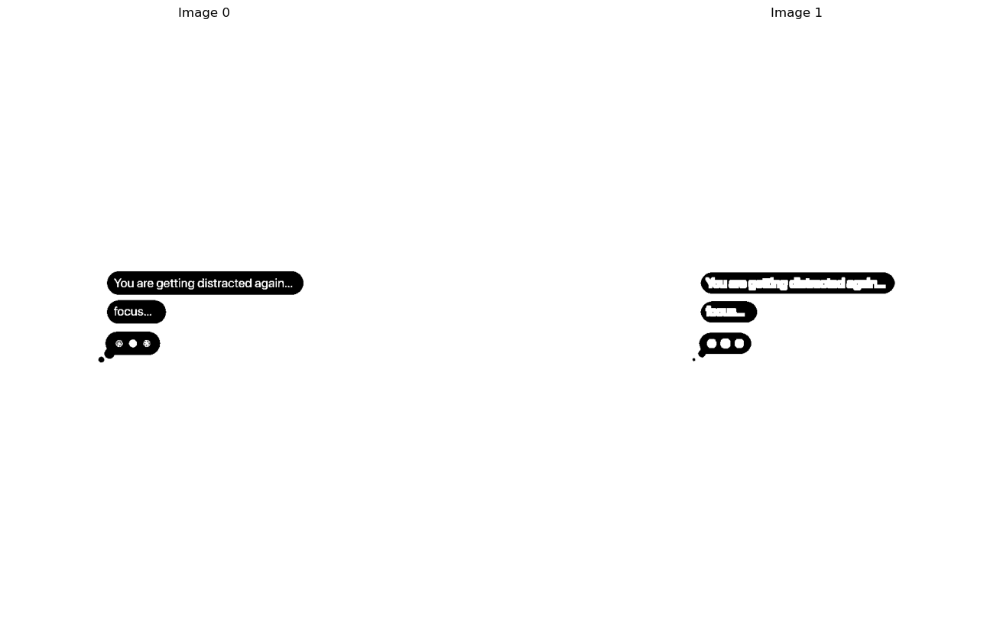

In [61]:
kernel = np.ones((3,3),np.uint8)
print(kernel)
image_dilated = cv2.dilate(image_mask01, kernel, iterations = 2)
ShowImage([image_mask01, image_dilated], 1, 2)